In [52]:
import pickle
import os
import numpy as np
import math
import matplotlib.pyplot as plt
from PIL import Image

data_dir = os.path.join("../../data/embeddings/")
with open(data_dir + "sample_points_cache/points_data_cache_with_CLIP_embeddings_and_scores_test.pkl", "rb") as f:
    point_records = pickle.load(f)

In [53]:
# Flatten all images across all points
all_image_paths = []
all_scores = []

for rec in point_records:
    all_image_paths.extend(rec["image_files"])
    all_scores.append(rec["category_scores"])

# Convert list of arrays → single (N,9) array
all_scores = np.vstack(all_scores)

In [54]:
categories = [ "a photo taken indoors, inside a building or a car",
    "a photo primarily of a terraced house",
    "a photo primarily of a detached or semi detached house",
    "a photo primarily of a road",
    "a photo of a shop",
    "a photo dominated by the outside of a car",
    "a photo of an industrial building",
    "a photo of wasteland, empty space",
    "a photo of nice green space, e.g. parks, gardens, nice trees and flowers"]

categories_short = ['indoors', 'terraced house', 'detached house', 'road', 'shop', 'car', 'industrial building',
                  'wasteland', 'greenery']
categories_dict = dict(zip(categories_short, categories))

### Join image embeddings points to gentrification LSOAs

### Classify

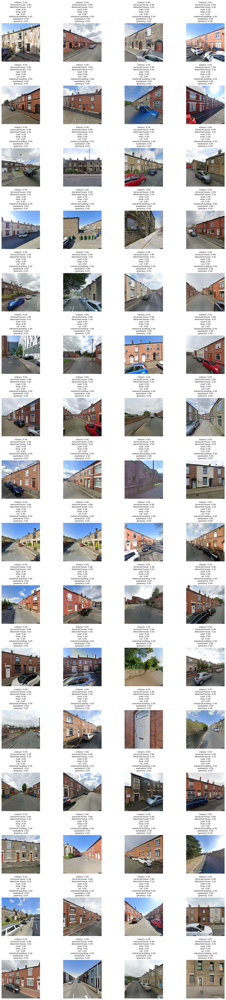

In [55]:
def plot_images_with_scores(
    image_paths,
    category_probs,
    category_short_names,
    n_images,
    n_cols=3,
    sort_by=None):
    """
    Plots images in a grid with category probabilities above each image.
    
    image_paths: list of image file paths
    category_probs: array (N_images, N_categories)
    category_short_names: list of short category names
    sort_by: one of the short category names
    """

    # ----- Sorting -----
    if sort_by is not None:
        sort_idx = np.argsort(category_probs[:, category_short_names.index(sort_by)])[::-1]
        image_paths = [image_paths[i] for i in sort_idx]
        category_probs = category_probs[sort_idx]

    # ----- Layout -----
    n_rows = math.ceil(n_images / n_cols)
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
    axs = axs.flatten()

    for i in range(n_images):
        try:
            img_path = image_paths[i]
            adj_path = img_path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
            img = Image.open(adj_path)
            axs[i].imshow(img)
        except:
            axs[i].axis("off")
            continue

        # ----- Print SHORT names -----
        scores_text = "\n".join([
            f"{short_name}: {category_probs[i, idx]:.2f}"
            for idx, short_name in enumerate(category_short_names)
        ])

        axs[i].set_title(scores_text, fontsize=9)
        axs[i].axis("off")

    # Turn off unused axes
    for j in range(n_images, len(axs)):
        axs[j].axis("off")

    plt.tight_layout()
    plt.show()


# plot_images_with_scores(image_paths_adj, category_probs, category_names, n_images=16, n_cols=4, sort_by="greenery")

plot_images_with_scores(
    all_image_paths,
    all_scores,
    categories_short,
    n_images=64,
    n_cols=4,
    sort_by="terraced house")
